# <font color=40534C size="6.5">**Building an Image Similarity Search Engine with FAISS & CLIP**</font>
Credit: [Lihi Gur Arie](https://medium.com/data-science/building-an-image-similarity-search-engine-with-faiss-and-clip-2211126d08fa) and [WikiArt Dataset](https://github.com/cs-chan/ArtGAN/blob/master/WikiArt%20Dataset/README.md)

<font color=40534C>**Install & import Requirements**</font>

In [ ]:
!python -m venv venv 
!source venv/bin/activate
!pip install -r requirements.txt

In [1]:
import os
from glob import glob
from PIL import Image
import numpy as np
import faiss
from sentence_transformers import SentenceTransformer
import matplotlib.pyplot as plt
import random
import math
from tqdm import tqdm
from sklearn.preprocessing import normalize

/Users/nicolas/Desktop/Extracurricular/Github/image-search/venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


<font color=40534C size="5.5">**Step 1 - Explore the Data**</font>

<font color=40534C>**Get the dataset and extract the zip file:**</font>

In [ ]:
!wget -O data.zip https://drive.usercontent.google.com/download?id=1q3dpti5aX4LdD3Mq7bZ4rjTeZbQEljiy&export=download&authuser=0
!unzip "data.zip"

In [ ]:
!gdown 'https://drive.google.com/uc?id=1vTChp3nU5GQeLkPwotrybpUGUXj12BTK'
!unzip 'wikiart.zip'

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Downloading...
From (original): https://drive.google.com/uc?id=1vTChp3nU5GQeLkPwotrybpUGUXj12BTK
From (redirected): https://drive.google.com/uc?id=1vTChp3nU5GQeLkPwotrybpUGUXj12BTK&confirm=t&uuid=a6b0b596-68f6-47c0-b14d-b9b31d963707
To: /Users/nicolas/Desktop/Extracurricular/Github/image-search/wikiart.zip
100%|██████████████████████████████████████| 27.3G/27.3G [10:14<00:00, 44.4MB/s]


<font color=40534C>**Display random images from the dataset:**</font>

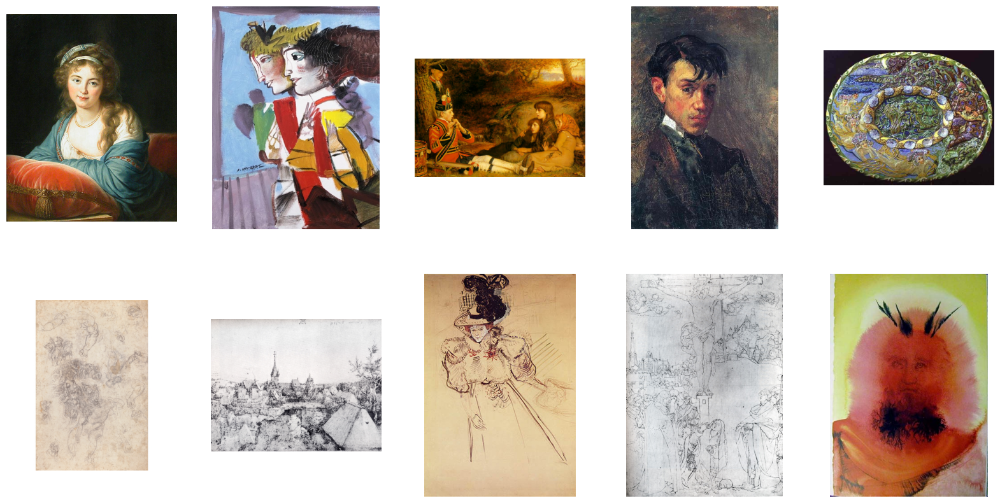

In [2]:
# image_folder = 'image_dataset'
image_folder = 'wikiart'

# Get a list of all image files in the folder
image_files = glob(os.path.join(image_folder, '**', '*.jpg'), recursive=True)

# Randomly select 10 image files
random.seed(42)
selected_images = random.sample(image_files, 10)

# Display the selected images
plt.figure(figsize=(20, 10))
for i, image_path in enumerate(selected_images):
    img = Image.open(image_path)
    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')
plt.show()

<font color=40534C size="5.5">**Step 2 - Generate CLIP embeddings**</font>

In [6]:
def generate_clip_embeddings(images_path, model):

    # Drill down through folder structure
    image_paths = glob(os.path.join(images_path, '**/*.jpg'), recursive=True)

    # Only keep valid paths and embeddings
    embeddings = []
    valid_image_paths = []

    for img_path in tqdm(image_paths):
        image = Image.open(img_path)
        try:
            embedding = model.encode(image, convert_to_numpy=True)
            embeddings.append(embedding)
            valid_image_paths.append(img_path)
        except:
            print(f"Image is incorrectly formatted: {img_path}")

    return embeddings, valid_image_paths

# IMAGES_PATH = 'image_dataset'
IMAGES_PATH = 'wikiart'

# Hugging Face provides a state of the art interface for text and image embeddings
model = SentenceTransformer('clip-ViT-B-32')
# Iterate
embeddings, image_paths = generate_clip_embeddings(IMAGES_PATH, model)
# Cosine similarity provides good abstraction of document similarities and requires normalization
# = dot product of v1 and v2 divided by len(v1)*len(v2) exists on [-1, 1]
embeddings = normalize(np.array(embeddings), axis=1)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
 32%|███▏      | 26233/81445 [17:20<27:26, 33.52it/s]  /Users/nicolas/Desktop/Extracurricular/Github/image-search/venv/lib/python3.12/site-packages/PIL/Image.py:3442: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
 33%|███▎      | 26520/81445 [17:29<26:02, 35.16it/s]  /Users/nicolas/Desktop/Extracurricular/Github/image-search/venv/lib/python3.12/site-packages/PIL/Image.py:3442: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
100%|██████████| 81445/81445 [52:34<00:00, 25.82i

<font color=40534C size="5.5">**Step 3 - Generate FAISS Index with Image Embeddings**</font>

<font color=40534C>**Create and Save FAISS Index:**</font>



In [27]:
def create_faiss_index(embeddings, image_paths, output_path):

    dimension = len(embeddings[0])
    # direct computation
    # only IndexFlat can guarantee exact results it provides the baseline for results for the other indexes. It does not compress the vectors, but does not add overhead on top of them
    index = faiss.IndexFlatIP(dimension)
    # map search results to document IDs
    index = faiss.IndexIDMap(index)

    vectors = np.array(embeddings).astype(np.float32)

    # Add vectors to the index with IDs
    index.add_with_ids(vectors, np.array(range(len(embeddings))))

    # Save the index
    faiss.write_index(index, output_path)
    print(f"Index created and saved to {output_path}")

    # Save image paths
    with open(output_path + '.paths', 'w') as f:
        for img_path in image_paths:
            f.write(img_path + '\n')

    return index


OUTPUT_INDEX_PATH = "wikiart_vector.index"
# Facebook AI Similarity Search
# https://github.com/facebookresearch/faiss/wiki/
# Builds a datastructure in memory to efficiently find nearest vectors
index = create_faiss_index(embeddings, image_paths, OUTPUT_INDEX_PATH)

Index created and saved to wikiart_vector.index


<font color=40534C>**Load FAISS index:**</font>



In [8]:
def load_faiss_index(index_path):
    index = faiss.read_index(index_path)

    with open(index_path + '.paths', 'r') as f:
        image_paths = [line.strip() for line in f]
        
    print(f"Index loaded from {index_path}")
    return index, image_paths

# Once trained, only these structures are necessary at runtime
OUTPUT_INDEX_PATH = "wikiart_vector.index"
model = SentenceTransformer('clip-ViT-B-32')
index, image_paths = load_faiss_index(OUTPUT_INDEX_PATH)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Index loaded from wikiart_vector.index


<font color=40534C size="5.5">**Step 4 - Retrieve Images by Text Query or Referance Image**</font>

<font color=40534C>**A function to retrive images with Text or Image query:**</font>



In [9]:
def retrieve_similar_images(query, model, index, image_paths, top_k=3):

    if query.endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp', '.gif')):
        query = Image.open(query)

    # Either text or image
    query_features = model.encode(query)

    # Add batching
    query_features = query_features.astype(np.float32).reshape(1, -1)

    # Prepare for cosine similarity
    query_features = normalize(query_features, axis=1)

    # Nearest neighbor search across 80,000+ images
    distances, indices = index.search(query_features, top_k)

    # For displaying result
    retrieved_images = [image_paths[int(idx)] for idx in indices[0]]

    return query, retrieved_images

<font color=40534C>**An helper function to display results:**</font>



In [10]:
def visualize_results(query, retrieved_images, figsize=(12,5)):
    plt.figure(figsize=figsize)

    # If image query
    if isinstance(query, Image.Image):
        plt.subplot(1, len(retrieved_images) + 1, 1)
        plt.imshow(query)
        plt.title("Query Image")
        plt.axis('off')
        start_idx = 2

    # If text query
    else:
        plt.subplot(1, len(retrieved_images) + 1, 1)
        plt.text(0.5, 0.5, f"Query:\n\n '{query}'", fontsize=16, ha='center', va='center')
        plt.axis('off')
        start_idx = 2

    # Display images
    for i, img_path in enumerate(retrieved_images):

        plt.subplot(1, len(retrieved_images) + 1, i + start_idx)
        plt.imshow(Image.open(img_path))
        plt.title(f"Match {i + 1}")
        plt.axis('off')

    plt.show()

<font color=40534C>**Search with a Text Query:**</font>



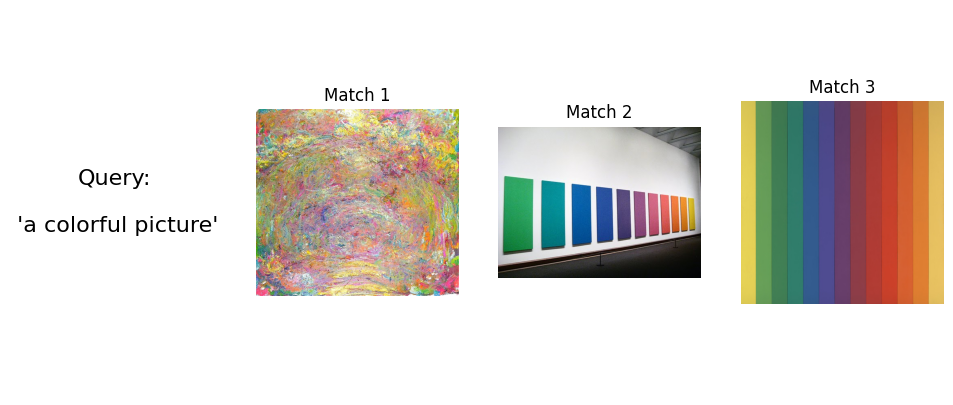

In [11]:
query = 'a colorful picture'
query, retrieved_images = retrieve_similar_images(query, model, index, image_paths, top_k=3)
visualize_results(query, retrieved_images)

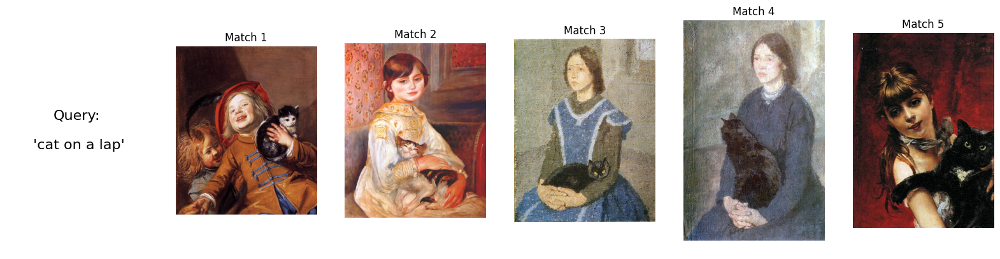

In [12]:
# Example with text query
query = 'cat on a lap'
query, retrieved_images = retrieve_similar_images(query, model, index, image_paths, top_k=5)
visualize_results(query, retrieved_images, figsize=(20, 5))

<font color=40534C>**Search with a Reference Image:**</font>



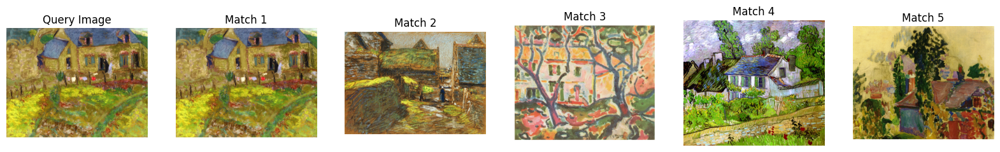

In [13]:
# query = 'image_dataset/pexels-w-w-299285-889839.jpg'
query = 'wikiart/Post_Impressionism/edouard-vuillard_breton-house.jpg'
query, retrieved_images = retrieve_similar_images(query, model, index, image_paths, top_k=5)
visualize_results(query, retrieved_images, figsize=(20, 15))

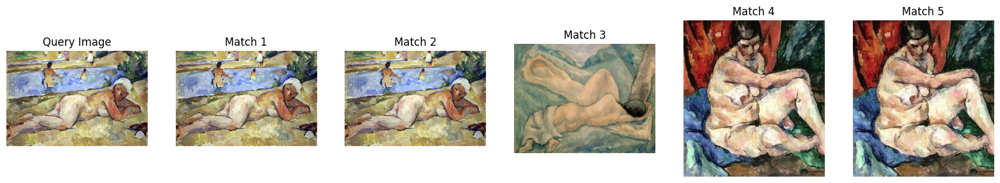

In [14]:
query = 'wikiart/Post_Impressionism/pyotr-konchalovsky_the-woman-on-the-bank-of-the-river-1922.jpg'
query, retrieved_images = retrieve_similar_images(query, model, index, image_paths, top_k=5)
visualize_results(query, retrieved_images, figsize=(20, 15))

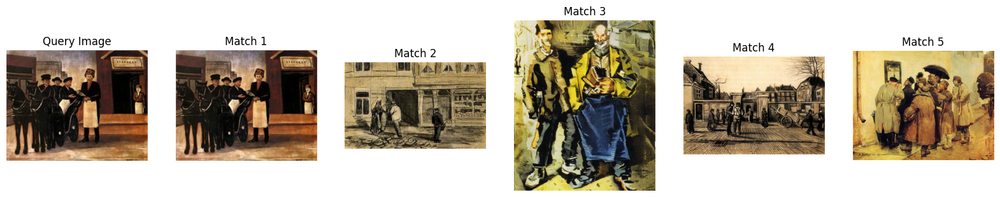

In [15]:
query = image_paths[-100]
query, retrieved_images = retrieve_similar_images(query, model, index, image_paths, top_k=5)
visualize_results(query, retrieved_images, figsize=(20, 15))

# Is the embedding language specific?
Yes. You must be careful to choose an embedding adapted to the input text. However, for pure image search, it should be robust to differences in lighting and pose.

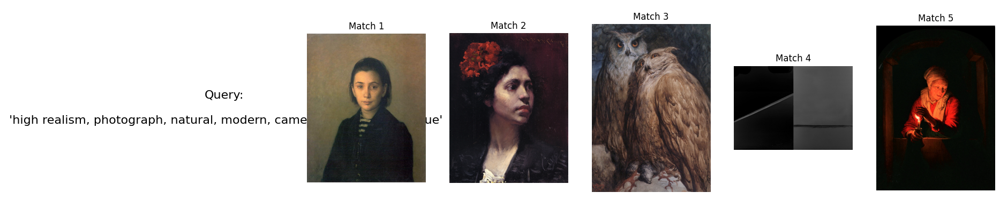

In [19]:
query = 'high realism, photograph, natural, modern, camera and light technique'
query, retrieved_images = retrieve_similar_images(query, model, index, image_paths, top_k=5)
visualize_results(query, retrieved_images, figsize=(20, 5))

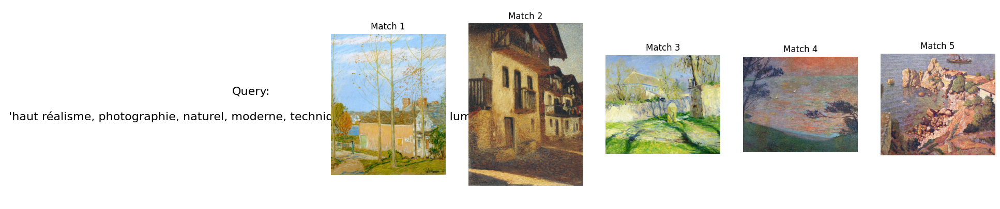

In [20]:
query = 'haut réalisme, photographie, naturel, moderne, technique de caméra et de lumière'
query, retrieved_images = retrieve_similar_images(query, model, index, image_paths, top_k=5)
visualize_results(query, retrieved_images, figsize=(20, 5))

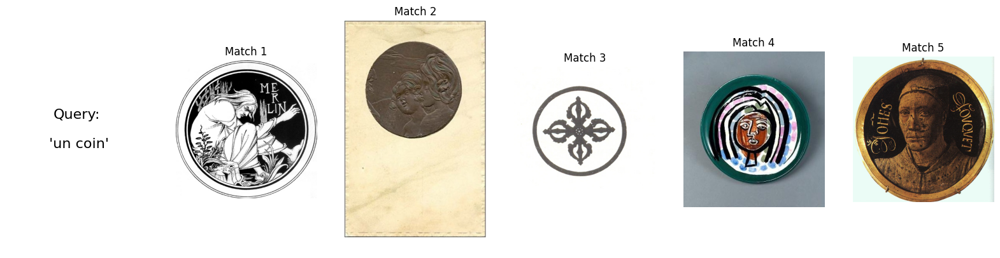

In [19]:
query = 'un coin'
query, retrieved_images = retrieve_similar_images(query, model, index, image_paths, top_k=5)
visualize_results(query, retrieved_images, figsize=(20, 5))

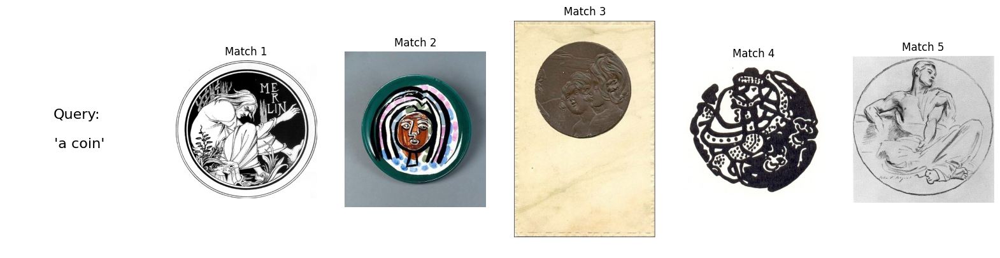

In [21]:
query = 'a coin'
query, retrieved_images = retrieve_similar_images(query, model, index, image_paths, top_k=5)
visualize_results(query, retrieved_images, figsize=(20, 5))

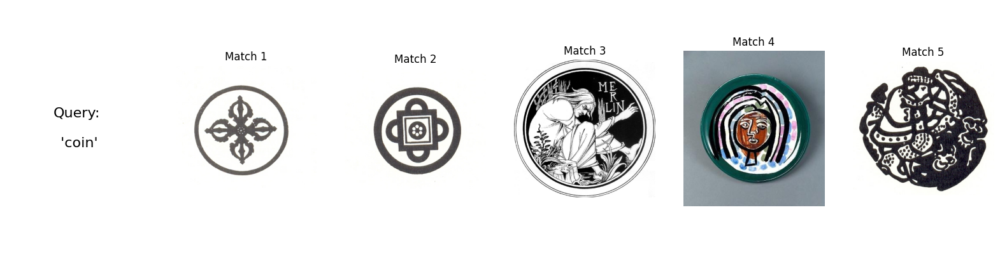

In [22]:
query = 'coin'
query, retrieved_images = retrieve_similar_images(query, model, index, image_paths, top_k=5)
visualize_results(query, retrieved_images, figsize=(20, 5))

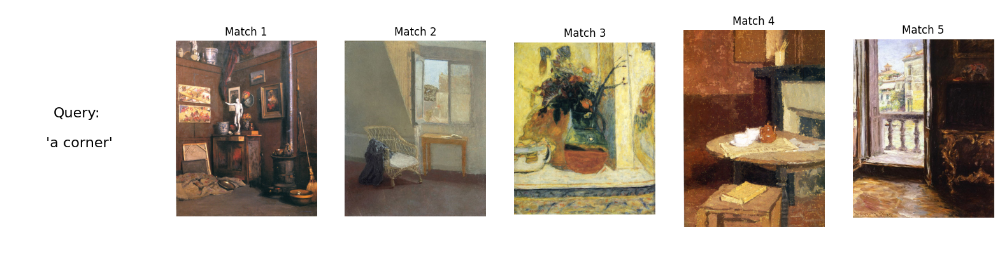

In [23]:
query = 'a corner'
query, retrieved_images = retrieve_similar_images(query, model, index, image_paths, top_k=5)
visualize_results(query, retrieved_images, figsize=(20, 5))

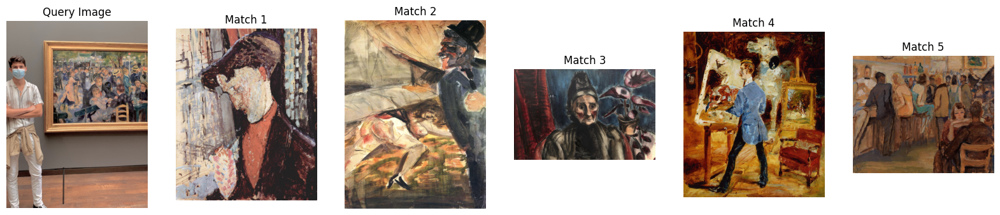

In [25]:
query = 'renoir-moulin-ball.jpg'
query, retrieved_images = retrieve_similar_images(query, model, index, image_paths, top_k=5)
visualize_results(query, retrieved_images, figsize=(20, 5))

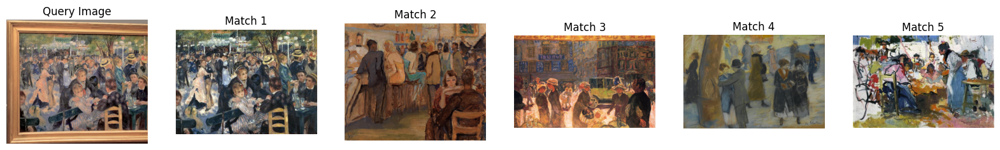

In [26]:
query = 'renoir-moulin-ball-crop.jpeg'
query, retrieved_images = retrieve_similar_images(query, model, index, image_paths, top_k=5)
visualize_results(query, retrieved_images, figsize=(20, 5))